## LIBs

In [1]:
import gymnasium as gym
from gymnasium import spaces
import numpy as np
import random
import logging
import pandas as pd

import matplotlib.pyplot as plt
import os
import datetime
import math

from collections import deque

from tensorboardX import SummaryWriter

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.distributions.dirichlet import Dirichlet

print(torch.cuda.is_available())
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

True
Device: cuda


## ENV

In [3]:
def process_actions(action, input_requests):
    action_sum = np.sum(action)
    if action_sum == 0:
        action_sum += 1e-8
    action /= action_sum

    local = int(action[0] * input_requests)
    forwarded = int(action[1] * input_requests)
    rejected = int(action[2] * input_requests)
    local_fraction= (action[0] * input_requests) - local
    forwarded_fraction = (action[1] * input_requests) - forwarded
    rejected_fraction = (action[2] * input_requests) - rejected
    total_actions = local + forwarded + rejected

    if total_actions < input_requests:
        fractions = [local_fraction, forwarded_fraction, rejected_fraction]
        actions = [local, forwarded, rejected]
        max_fraction_index = np.argmax(fractions)
        actions[max_fraction_index] += input_requests - total_actions
        local, forwarded, rejected = actions

    return local, forwarded, rejected

In [4]:
def calculate_reward1(local, forwarded, rejected, QUEUE_factor, FORWARD_factor):
    reward_local = 3 * local * QUEUE_factor
    reward_forwarded = 1 * forwarded * (1 - QUEUE_factor) * FORWARD_factor
    reward_rejected = -5 * rejected * FORWARD_factor * QUEUE_factor
    reward = reward_local + reward_forwarded + reward_rejected

    return reward

In [5]:
class TrafficManagementEnv(gym.Env):
    def __init__(self, CPU_capacity = 50, queue_capacity = 100, queue_length = 0, forward_capacity = 100, average_requests = 100, amplitude_requests = 50, period=50):
        super().__init__()
        self.action_space = spaces.Box(low=0, high=1, shape=(3,), dtype=np.float32)
        self.observation_space = spaces.Box(low = np.array([50, -100, 0, 0]), high = np.array([150, 50, 100, 100]), dtype = np.float32)

        self.max_CPU_capacity = CPU_capacity
        self.max_queue_capacity = queue_capacity
        self.queue_length = queue_length

        self.average_requests = average_requests
        self.amplitude_requests = amplitude_requests
        self.period = period
        self.t = 0

        self.max_forward_capacity = forward_capacity
        self.forward_capacity_t = self.max_forward_capacity

        self.input_requests = self.calculate_requests()

    def calculate_requests(self):
        return int(self.average_requests + self.amplitude_requests * math.sin(2 * math.pi * self.t / self.period))
    
    def reset(self):
        self.t = 0
        self.CPU_capacity = self.max_CPU_capacity
        self.queue_capacity = self.max_queue_capacity
        self.forward_capacity = self.max_forward_capacity
        self.forward_capacity_t = self.max_forward_capacity
        self.queue_length = 0

        return np.array([self.input_requests, self.CPU_capacity, self.queue_capacity, self.forward_capacity], dtype=np.float32)
    
    def step(self, action):
        print(f"INPUT: {self.input_requests}")
        print(f"CPU Capacity: {self.CPU_capacity}")
        print(f"Queue Capacity: {self.queue_capacity}")
        print(f"Forward Capacity: {self.forward_capacity}")
    
        self.local, self.forwarded, self.rejected = process_actions(action, self.input_requests)

        print(f"LOCAL: {self.local}")
        print(f"FORWARDED: {self.forwarded}")
        print(f"REJECTED: {self.rejected}")

        self.QUEUE_factor = self.queue_capacity / self.max_queue_capacity
        self.FORWARD_factor = self.forward_capacity / self.max_forward_capacity

        reward = calculate_reward1(self.local, self.forwarded, self.rejected, self.QUEUE_factor, self.FORWARD_factor)
        print(f"REWARD: {reward}")

        self.queue_length = max(0, self.local - self.CPU_capacity)
        self.CPU_capacity = max(-100, self.max_CPU_capacity - self.queue_length)
        self.queue_capacity = max(0, self.max_queue_capacity - self.queue_length)

        self.forward_capacity = int(25 + 75 * (1 + math.sin(2 * math.pi * self.t / self.period)) / 2)
        self.forward_capacity_t = self.forward_capacity

        done = self.queue_capacity <= 0
        self.t += 1
        self.input_requests = self.calculate_requests()
        state = np.array([self.input_requests, self.CPU_capacity, self.queue_capacity, self.forward_capacity], dtype=np.float32)
        
        return state, reward, done

## SAC

In [6]:
class Actor(nn.Module):
    def __init__(self, state_dim, action_dim):
        super(Actor, self).__init__()
        self.fc1 = nn.Linear(state_dim, 64)
        self.fc2 = nn.Linear(64, 64)
        self.fc3 = nn.Linear(64, action_dim)

    def forward(self, state):
        x = torch.relu(self.fc1(state))
        x = torch.relu(self.fc2(x))
        x = torch.softmax(self.fc3(x), dim=-1)
        return x

class Critic(nn.Module):
    def __init__(self, state_dim, action_dim):
        super(Critic, self).__init__()
        self.fc1 = nn.Linear(state_dim + action_dim, 64)
        self.fc2 = nn.Linear(64, 64)
        self.fc3 = nn.Linear(64, 1)

    def forward(self, state, action):
        x = torch.relu(self.fc1(torch.cat([state, action], dim=-1)))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

In [7]:
class ReplayBuffer:
    def __init__(self, max_size, state_dim, action_dim):
        self.max_size = max_size
        self.state_memory = np.zeros((max_size, state_dim), dtype=np.float32)
        self.action_memory = np.zeros((max_size, action_dim), dtype=np.float32)
        self.reward_memory = np.zeros(max_size, dtype=np.float32)
        self.next_state_memory = np.zeros((max_size, state_dim), dtype=np.float32)
        self.done_memory = np.zeros(max_size, dtype=np.bool_)
        self.pointer = 0
        self.size = 0

    def store(self, state, action, reward, next_state, done):
        idx = self.pointer % self.max_size
        self.state_memory[idx] = state
        self.action_memory[idx] = action
        self.reward_memory[idx] = reward
        self.next_state_memory[idx] = next_state
        self.done_memory[idx] = done
        self.pointer += 1
        self.size = min(self.size + 1, self.max_size)

    def sample(self, batch_size):
        idxs = np.random.randint(0, self.size, size=batch_size)
        return (self.state_memory[idxs], self.action_memory[idxs], self.reward_memory[idxs],
                self.next_state_memory[idxs], self.done_memory[idxs])


In [8]:
class SAC:
    def __init__(self, state_dim, action_dim, device, lr=3e-4, gamma=0.9, tau=0.005, alpha=0.3):
        self.device = device
        self.actor = Actor(state_dim, action_dim).to(device)
        self.critic_1 = Critic(state_dim, action_dim).to(device)
        self.critic_2 = Critic(state_dim, action_dim).to(device)
        self.target_critic_1 = Critic(state_dim, action_dim).to(device)
        self.target_critic_2 = Critic(state_dim, action_dim).to(device)
        self.soft_update(tau=1)  # Copy the critic parameters initially

        self.actor_optimizer = optim.Adam(self.actor.parameters(), lr=lr)
        self.critic_1_optimizer = optim.Adam(self.critic_1.parameters(), lr=lr)
        self.critic_2_optimizer = optim.Adam(self.critic_2.parameters(), lr=lr)
        self.gamma = gamma
        self.tau = tau
        self.alpha = alpha

    def soft_update(self, tau=None):
        if tau is None:
            tau = self.tau
        for t_param, param in zip(self.target_critic_1.parameters(), self.critic_1.parameters()):
            t_param.data.copy_((1 - tau) * t_param + tau * param)
        for t_param, param in zip(self.target_critic_2.parameters(), self.critic_2.parameters()):
            t_param.data.copy_((1 - tau) * t_param + tau * param)

    def train(self, replay_buffer, batch_size):
        state, action, reward, next_state, done = replay_buffer.sample(batch_size)
        state = torch.from_numpy(state).float().to(self.device)
        action = torch.from_numpy(action).float().to(self.device)
        reward = torch.from_numpy(reward).float().unsqueeze(1).to(self.device)
        next_state = torch.from_numpy(next_state).float().to(self.device)
        done = torch.from_numpy(done).float().unsqueeze(1).to(self.device)

        # Critic loss
        with torch.no_grad():
            next_action = self.actor(next_state)
            target_q1 = self.target_critic_1(next_state, next_action)
            target_q2 = self.target_critic_2(next_state, next_action)
            target_q = torch.min(target_q1, target_q2)
            target_value = reward + (1 - done) * self.gamma * target_q

        current_q1 = self.critic_1(state, action)
        current_q2 = self.critic_2(state, action)
        critic_1_loss = nn.functional.mse_loss(current_q1, target_value)
        critic_2_loss = nn.functional.mse_loss(current_q2, target_value)

        # Update critics
        self.critic_1_optimizer.zero_grad()
        critic_1_loss.backward()
        self.critic_1_optimizer.step()

        self.critic_2_optimizer.zero_grad()
        critic_2_loss.backward()
        self.critic_2_optimizer.step()

        # Actor loss
        dist = Dirichlet(self.actor(state))
        new_action = dist.rsample()
        log_prob = dist.log_prob(new_action).sum(dim=-1, keepdim=True)
        q1 = self.critic_1(state, new_action)
        q2 = self.critic_2(state, new_action)
        q = torch.min(q1, q2)
        actor_loss = (self.alpha * log_prob - q).mean()

        # Update actor
        self.actor_optimizer.zero_grad()
        actor_loss.backward()
        self.actor_optimizer.step()

        # Soft update target critics
        self.soft_update()

        return actor_loss.item(), critic_1_loss.item(), critic_2_loss.item()

    def select_action(self, state):
        #with torch.no_grad():
        state = torch.FloatTensor(state).unsqueeze(0).to(self.device)
        dist = Dirichlet(self.actor(state))
        action = dist.sample().squeeze(0).cpu().numpy()
        return action

- `Addestramento`: L'addestramento del SAC avviene attraverso l'interazione tra due entità, l'Attore e il Critico. L'Attore è responsabile di decidere quale azione intraprendere dato uno stato, mentre il Critico valuta la bontà di queste azioni date le circostanze. Queste valutazioni sono usate per aggiornare i pesi del modello dell'Attore in modo che produca azioni migliori. Nell'implementazione, questo si traduce nel calcolo di tre funzioni di perdita distinte: una per l'Attore e due per i Critici. Per l'Attore, la funzione di perdita è definita come la differenza tra la quantità di reward attesi (Q-values) e l'entropia della politica dell'Attore, moltiplicata per un parametro di temperatura (alpha). Questa perdita guida l'Attore a selezionare azioni che massimizzano il reward atteso, mantenendo al contempo una distribuzione di probabilità di azioni diversificata. Per i Critici, la funzione di perdita è la differenza tra i Q-values attuali e i Q-values obiettivo. Questi ultimi sono calcolati a partire dalla prossima azione scelta dall'Attore, e il reward ottenuto da questa azione più il reward atteso (dato da gamma*Q-value) dalla prossima azione se il prossimo stato non è un stato terminale. Queste funzioni di perdita guidano i Critici a fare stime più accurate dei Q-values.  

- `Comportamento delle funzioni di perdita`: Ci aspettiamo che le funzioni di perdita dei Critici tendano a 0 con l'apprendimento, poiché i Critici dovrebbero diventare sempre più bravi a stimare il valore corretto di Q. Per l'Attore, non c'è una direzione di convergenza chiara per la funzione di perdita come nel caso dei Critici. Questo perché la perdita dell'Attore è la differenza tra i Q-values e l'entropia della politica, che può variare a seconda della complessità del task. Idealmente, vogliamo che l'entropia sia alta (il che significa una perdita negativa) per esplorare adeguatamente l'ambiente, ma con l'apprendimento, ci aspettiamo che l'entropia (e quindi la perdita) diminuisca man mano che l'Attore inizia a convergere verso una politica più deterministica.  

- `Exploration ed Exploitation`: Il rapporto tra exploration ed exploitation in un algoritmo di reinforcement learning si riferisce a quanto l'agente dovrebbe cercare di scoprire nuove azioni che potrebbero portare a ricompense più alte (exploration) rispetto a sfruttare le azioni che sa già portare a ricompense elevate (exploitation). Nel SAC, questo rapporto è regolato attraverso l'uso del parametro di entropia alpha. Un valore di alpha più alto favorisce l'esplorazione perché incoraggia una maggiore diversità di azioni, mentre un valore più basso favorisce l'exploitation perché l'agente sceglierà azioni che massimizzano le ricompense previste. Nell'implementazione, alpha è un parametro fisso che non cambia nel corso dell'addestramento.



## TRAINING

In [9]:
def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w

window_size = 500

In [10]:
def train_sac_agent(env, agent, buffer_size=1000000, batch_size=256, num_episodes=5000, max_steps_per_episode=50, warm_up=1024):
    replay_buffer = ReplayBuffer(max_size=buffer_size, state_dim=env.observation_space.shape[0], action_dim=env.action_space.shape[0])
    total_rewards = []
    actor_losses = []
    critic1_losses = []
    critic2_losses = []
    steps = 0

    # SummaryWriter per scrivere i log
    writer = SummaryWriter(log_dir="logs")

    for episode in range(num_episodes):
        state = env.reset()
        episode_reward = 0
        episode_actor_loss = 0
        episode_critic1_loss = 0
        episode_critic2_loss = 0

        for step in range(max_steps_per_episode):
            action = agent.select_action(state)
            next_state, reward, done = env.step(action)

            replay_buffer.store(state, action, reward, next_state, done)

            if replay_buffer.size > warm_up:
                actor_loss, critic_1_loss, critic_2_loss = agent.train(replay_buffer, batch_size)
                episode_actor_loss += actor_loss
                episode_critic1_loss += critic_1_loss
                episode_critic2_loss += critic_2_loss

                # scriviamo le loss nel SummaryWriter
                writer.add_scalar('Loss/Actor', actor_loss, steps)
                writer.add_scalar('Loss/Critic1',critic_1_loss, steps)
                writer.add_scalar('Loss/Critic2',critic_2_loss, steps)

            state = next_state
            episode_reward += reward
            steps += 1

            if done:
                break

        total_rewards.append(episode_reward)
        actor_losses.append(episode_actor_loss / step)
        critic1_losses.append(episode_critic1_loss / step)
        critic2_losses.append(episode_critic2_loss / step)

        print(f"Episode: {episode + 1}, Reward: {episode_reward}")

    writer.close() 

    metrics = pd.DataFrame({'Reward': total_rewards, 'Actor Loss': actor_losses, 
                            'Critic 1 Loss': critic1_losses, 'Critic 2 Loss': critic2_losses})
    metrics.to_csv('metrics.csv')

    smoothed_total_reward = moving_average(total_rewards, window_size)
    smoothed_actor_losses = moving_average(actor_losses, window_size)
    smoothed_critic1_losses = moving_average(critic1_losses, window_size)
    smoothed_critic2_losses = moving_average(critic2_losses, window_size)

    # plot reward and losses
    plt.figure(figsize=(12, 8))
    plt.plot(smoothed_actor_losses, label='Actor Loss')
    plt.plot(smoothed_critic1_losses, label='Critic1 Loss')
    plt.plot(smoothed_critic2_losses, label='Critic2 Loss')
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 8))
    plt.plot(smoothed_total_reward, label='Reward')
    plt.legend()
    plt.show()

c:\Users\giaco\AppData\Local\Programs\Python\Python38\lib\site-packages\gymnasium\spaces\box.py:130: UserWarning: WARN: Box bound precision lowered by casting to float32
  gym.logger.warn(f"Box bound precision lowered by casting to {self.dtype}")


INPUT: 100
CPU Capacity: 50
Queue Capacity: 100
Forward Capacity: 100
LOCAL: 93
FORWARDED: 0
REJECTED: 7
REWARD: 244.0
INPUT: 106
CPU Capacity: 7
Queue Capacity: 57
Forward Capacity: 62
LOCAL: 0
FORWARDED: 0
REJECTED: 106
REWARD: -187.302
INPUT: 112
CPU Capacity: 50
Queue Capacity: 100
Forward Capacity: 67
LOCAL: 111
FORWARDED: 0
REJECTED: 1
REWARD: 329.65
INPUT: 118
CPU Capacity: -11
Queue Capacity: 39
Forward Capacity: 71
LOCAL: 0
FORWARDED: 0
REJECTED: 118
REWARD: -163.371
INPUT: 124
CPU Capacity: 39
Queue Capacity: 89
Forward Capacity: 76
LOCAL: 80
FORWARDED: 0
REJECTED: 44
REWARD: 64.792
INPUT: 129
CPU Capacity: 9
Queue Capacity: 59
Forward Capacity: 80
LOCAL: 0
FORWARDED: 0
REJECTED: 129
REWARD: -304.44
INPUT: 134
CPU Capacity: 50
Queue Capacity: 100
Forward Capacity: 84
LOCAL: 91
FORWARDED: 0
REJECTED: 43
REWARD: 92.4
INPUT: 138
CPU Capacity: 9
Queue Capacity: 59
Forward Capacity: 88
LOCAL: 0
FORWARDED: 0
REJECTED: 138
REWARD: -358.248
INPUT: 142
CPU Capacity: 50
Queue Capacity:

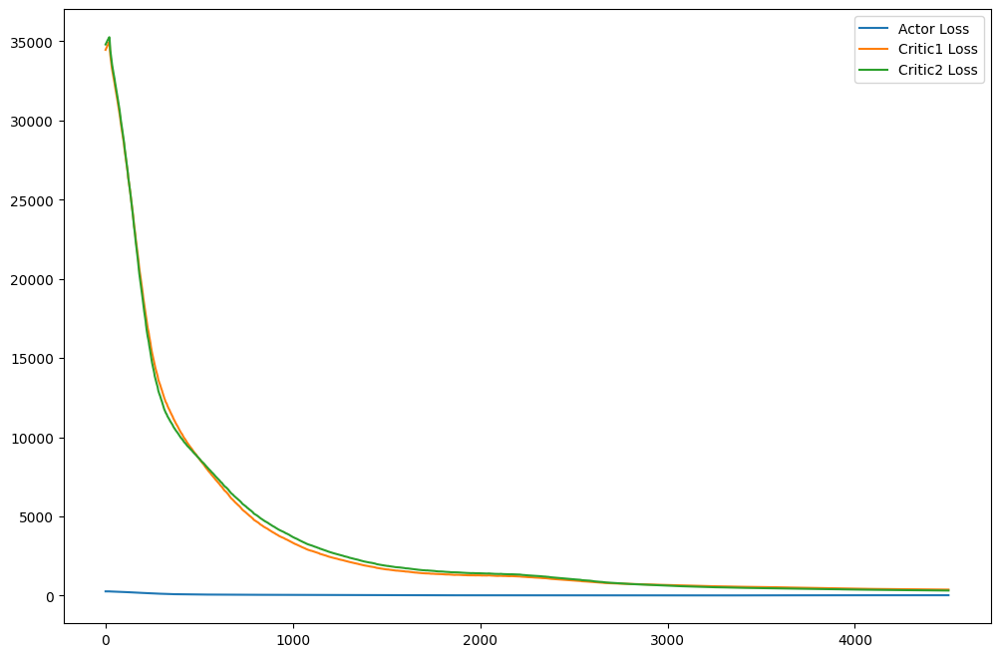

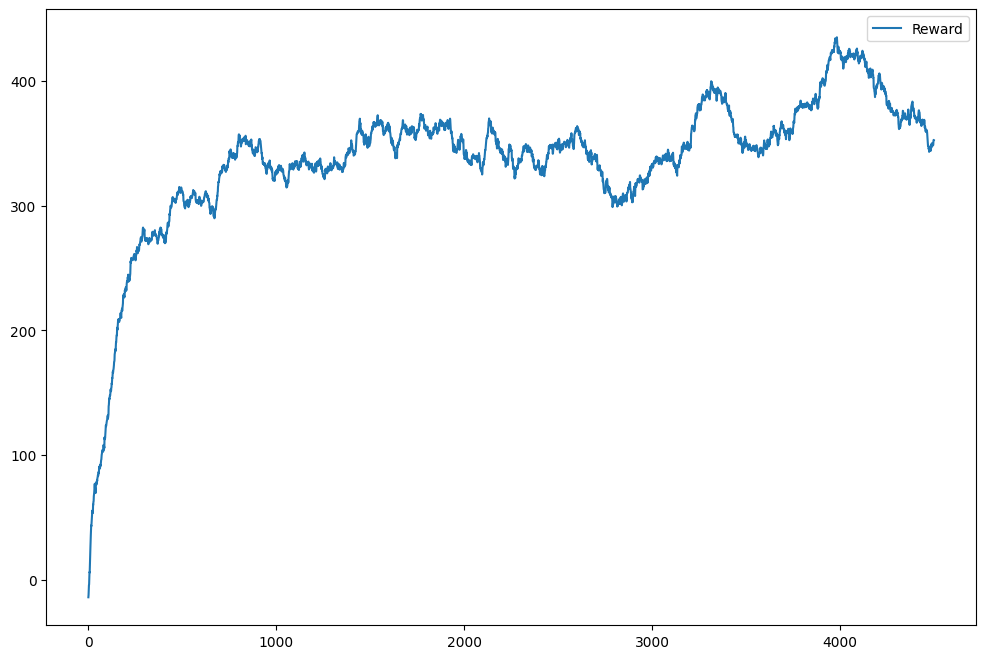

In [11]:
if __name__ == "__main__":
    env = TrafficManagementEnv()
    state_dim = env.observation_space.shape[0]
    action_dim = env.action_space.shape[0]

    sac_agent = SAC(state_dim, action_dim, device)

    train_sac_agent(env, sac_agent)